## Capstone: How Much Should We Sell Our Houses For?

Over the past few weeks, you have helped Modal Homes build a handful of different models that predict how quickly a house will sell. You've build the following:
- A binary classification model that predicts whether a house will sell in under 30 days
- A multi-class classification model that predicts whether a house will sell in under 30 days, over 30 days, or not at all
- A regression model that predicts the number of days it will take for a house to sell

Now, the team has provided you with a dataset of current houses that they have available to sell. Modal Homes has not yet set an asking price for these houses. They've asked you to answer the following:

- What price should they list each house at?
- Using those asking prices, along with the other data about the houses, how long it will take for each house to sell?

### Instructions

1. Modal Homes has given you a dataset (`historical_prices.csv`) that contains information about houses that were previously sold, and the price they were sold at. Clean this data and create a neural network regression model that can predict the selling price of a house. Evaluate this model.
2. Modal Homes has also given you a dataset (`houses_to_sell.csv`) of 5 houses that they are looking to put on the market. Use your regression model to predict the selling price of those houses.
3. Now that we have an estimate of how much each house will sell for, Modal Homes wants to know how quickly they can sell each house if they were to list the house at that price. Use the neural networks you created in the previous challenges (trained on the data found in `housing_status.csv`) to predict the time it will take to sell each house.
4. Create a presentation describing detailing the predicted price of each house along with the time you estimate it will take to sell each house at that price. Explain and justify which model you used to predict the time it would take to sell each house.

### Data Descriptions

1. **historical_prices**: Contains information about all houses that Modal Homes has successfully sold.
2. **housing_status.csv**: Contains information about all houses listed by Modal Homes &mdash; including houses that did not sell. 
3. **houses_to_sell.csv**: Contains information about 5 houses that Modal Houses is looking to put on the market.


### Consider

- How does changing the listing price of the house affect the time it takes to sell?
- Do you want to report the exact number of days you predict it will take to sell the house? Or is it better to give a broader estimate like "greater than 30 days"?
- Make sure to standardize your data throughout this process. After making a prediction about the cost of a house, that prediction should be standardized before being used in the model that predicts the time it takes to sell the house.

### Submit Your Work

Your final submission should include:
- The code you used to generate the findings and/or visualizations that are included in your presentation (which can be submitted in this Jupyter notebook).
- A presentation of your findings, submitted as a PDF. You’ll also present these slides to the Modal Homes management team at the end of this course.

In [1]:
# Relevant imports - you may want to add more as you work through this capstone

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import  InputLayer
from tensorflow.keras.layers import  Dense

In [2]:
# additional packages
import seaborn as sns

In [3]:
#1 - PRICES data
prices=pd.read_csv('historical_prices.csv')

In [4]:
prices

,selling_price,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated
0,311000.0,3,1.00,oil,1640,12060,1.0,poor,good,7,1640,1960,0.0
1,535000.0,2,1.00,oil,980,4120,1.0,poor,average,7,830,1950,2014.0
2,425000.0,3,1.50,gas,1190,8100,1.0,poor,average,7,830,1947,0.0
3,636100.0,3,1.00,oil,1010,6000,1.5,poor,average,7,1010,1919,1977.0
4,410000.0,2,1.00,gas,1560,10125,1.0,poor,good,7,1130,1954,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9199,506000.0,3,2.00,oil,1160,6120,1.0,poor,average,7,1160,1947,0.0
9200,246000.0,3,2.25,oil,1440,10500,1.0,poor,average,8,1130,1983,0.0
9201,736000.0,4,2.50,oil,2290,12047,2.0,poor,good,9,2290,1988,0.0
9202,325000.0,2,1.00,oil,840,4239,1.0,poor,average,7,840,1948,0.0


In [5]:
# I want to make this chart in Google 

inter1=prices[['selling_price','sqft_living']]
inter1['sqft_living']=inter1['sqft_living'].round(-3)
nice_chart1=inter1.groupby('sqft_living')['selling_price'].mean().reset_index()
nice_chart1

<ipython-input-5-872e63b2472c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inter1['sqft_living']=inter1['sqft_living'].round(-3)


,sqft_living,selling_price
0,0,1.991938e+05
1,1000,3.450611e+05
2,2000,4.651016e+05
3,3000,6.858461e+05
4,4000,1.002452e+06
5,5000,1.432618e+06
6,6000,1.947619e+06
7,7000,2.505000e+06
8,8000,3.000000e+06


In [265]:
orig=pd.read_csv('historical_prices.csv')

In [267]:
orig['bedrooms'].value_counts()

3    4377
4    2833
2    1220
5     595
6      85
1      79
7       8
8       4
9       3
Name: bedrooms, dtype: int64

In [6]:
prices['bathrooms'].value_counts()

2.50    2361
1.00    1754
1.75    1310
2.25     883
2.00     837
1.50     655
2.75     436
3.00     282
3.50     278
3.25     212
3.75      55
4.00      37
0.75      29
4.50      25
4.25      22
4.75       6
1.25       6
5.00       5
5.25       3
5.50       2
0.50       2
6.50       2
6.25       1
6.00       1
Name: bathrooms, dtype: int64

In [7]:
#2 - STATUS
status=pd.read_csv('housing_status.csv')

In [8]:
status.head(5)

,sold_in_30,status,days_until_sold,asking_price,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated
0,1,sold in 30 days,13.0,221900.0,3,1.00,electric,1180,5650,1.0,0,2,7,1180,1955,0.0
1,0,sold after 30 days,93.0,538000.0,3,2.25,gas,2570,7242,2.0,0,2,7,2170,1951,1991.0
2,0,sold after 30 days,62.0,510000.0,3,2.00,gas,1680,8080,1.0,0,2,8,1680,1987,0.0
3,1,sold in 30 days,14.0,291850.0,3,1.50,gas,1060,9711,1.0,0,2,7,1060,1963,0.0
4,1,sold in 30 days,28.0,468000.0,2,1.00,gas,1160,6000,1.0,0,3,7,860,1942,0.0


In [9]:
# I am going to create a new dataframe to explain the "Velocity" of money
s2=status[['days_until_sold','asking_price']]
s2['asking_price']=s2['asking_price'].round(-4)
s2

<ipython-input-9-663e1d47ab16>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s2['asking_price']=s2['asking_price'].round(-4)


,days_until_sold,asking_price
0,13.0,220000.0
1,93.0,540000.0
2,62.0,510000.0
3,14.0,290000.0
4,28.0,470000.0
...,...,...
11587,16.0,610000.0
11588,106.0,1010000.0
11589,18.0,480000.0
11590,11.0,400000.0


In [10]:
velocity=s2.groupby('asking_price')['days_until_sold'].mean().reset_index()
velocity.columns = ['asking_price', 'days_until_sold']
velocity.head(10)

,asking_price,days_until_sold
0,80000.0,9.000000
1,90000.0,10.000000
2,100000.0,11.000000
3,110000.0,10.384615
4,120000.0,11.933333
5,130000.0,10.846154
6,140000.0,12.500000
7,150000.0,14.750000
8,160000.0,12.357143
9,170000.0,15.463415


In [11]:
velocity['money_per_day']=velocity['asking_price']*0.025/velocity['days_until_sold']
# the typical real estate commission in the United States is 2.5% of the price of the house
# if we divide the commission by the number of days sold, we get a "commissions per day"
velocity

,asking_price,days_until_sold,money_per_day
0,80000.0,9.000000,222.222222
1,90000.0,10.000000,225.000000
2,100000.0,11.000000,227.272727
3,110000.0,10.384615,264.814815
4,120000.0,11.933333,251.396648
...,...,...,...
247,4500000.0,183.000000,614.754098
248,4670000.0,183.000000,637.978142
249,5350000.0,183.000000,730.874317
250,5570000.0,183.000000,760.928962


<AxesSubplot:xlabel='asking_price', ylabel='money_per_day'>

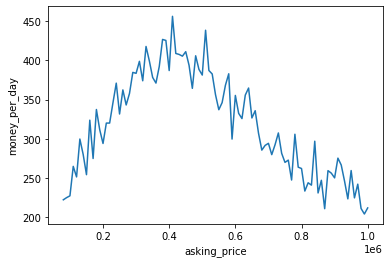

In [12]:
velocity=velocity[velocity['asking_price']<=1000000]
sns.lineplot(data=velocity, x='asking_price', y='money_per_day')

In [13]:
pd.set_option('display.max_rows', None)

velocity.head(90)

,asking_price,days_until_sold,money_per_day
0,80000.0,9.000000,222.222222
1,90000.0,10.000000,225.000000
2,100000.0,11.000000,227.272727
3,110000.0,10.384615,264.814815
4,120000.0,11.933333,251.396648
5,130000.0,10.846154,299.645390
6,140000.0,12.500000,280.000000
7,150000.0,14.750000,254.237288
8,160000.0,12.357143,323.699422
9,170000.0,15.463415,274.842271


In [14]:
# Whammy dammy!

In [15]:
pd.reset_option('display.max_rows')

In [16]:
status.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11592 entries, 0 to 11591
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sold_in_30       11592 non-null  int64  
 1   status           11592 non-null  object 
 2   days_until_sold  11592 non-null  float64
 3   asking_price     11592 non-null  float64
 4   bedrooms         11592 non-null  int64  
 5   bathrooms        11592 non-null  float64
 6   heating          11592 non-null  object 
 7   sqft_living      11592 non-null  int64  
 8   sqft_lot         11592 non-null  int64  
 9   floors           11592 non-null  float64
 10  view             11592 non-null  int64  
 11  condition        11592 non-null  int64  
 12  grade            11592 non-null  int64  
 13  sqft_above       11592 non-null  int64  
 14  yr_built         11592 non-null  int64  
 15  yr_renovated     11592 non-null  float64
dtypes: float64(5), int64(9), object(2)
memory usage: 1.4+ MB


In [17]:
inter2=status[['asking_price','days_until_sold']]
inter2['asking_price']=inter2['asking_price'].round(-5)
nice_chart2=inter2.groupby('asking_price')['days_until_sold'].mean().reset_index()
nice_chart2

<ipython-input-17-d4425d0e420e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inter2['asking_price']=inter2['asking_price'].round(-5)


,asking_price,days_until_sold
0,100000.0,11.522727
1,200000.0,16.338005
2,300000.0,19.858352
3,400000.0,24.823250
4,500000.0,32.241895
5,600000.0,43.502950
6,700000.0,58.365796
7,800000.0,75.826984
8,900000.0,89.969605
9,1000000.0,112.494024


In [18]:
#3 - TO-SELL
to_sell=pd.read_csv('houses_to_sell.csv')

In [19]:
to_sell.head(5)

,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated
0,5,4.25,oil,4010,8252,2.0,poor,average,10,4010,2015,0.0
1,4,3.25,gas,4110,15488,2.0,average,average,11,4110,1995,0.0
2,5,3.00,gas,2660,7700,1.5,poor,good,7,1670,1962,0.0
3,3,2.50,other,4010,12105,1.0,good,very good,11,2600,1983,0.0
4,3,3.25,electric,4720,32467,2.0,average,average,10,3190,1998,0.0


In [20]:
status['grade'].value_counts()
# ok good, I was double checking you weren't trying to sneak a grade 11 house on me!

7     4807
8     3257
9     1394
6     1106
10     610
11     212
5      136
12      46
4       15
13       8
3        1
Name: grade, dtype: int64

# I am going to take a "shortcut" that strict data scientists won't like
# But as with ANY assumption I can always test
can I just standardize the key pieces of data across all datasets without having to worry about test/train? (YES)

/usr/local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


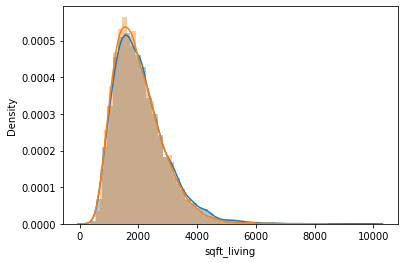

In [21]:
# let's make sure when we standardize that the distributions of both datasets look correct
sns.distplot(status['sqft_living'], label='status', kde=True)
sns.distplot(prices['sqft_living'], label='prices 2', kde=True)
plt.show()

/usr/local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


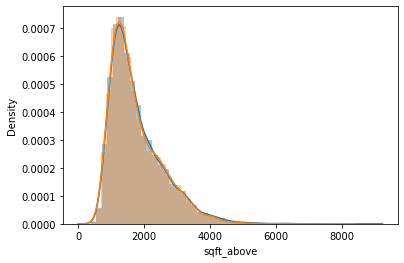

In [22]:
# let's make sure when we standardize that the distributions of both datasets look correct
sns.distplot(status['sqft_above'], label='status', kde=True)
sns.distplot(prices['sqft_above'], label='prices', kde=True)
plt.show()

/usr/local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


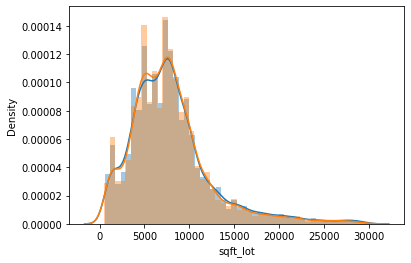

In [23]:
# let's make sure when we standardize that the distributions of both datasets look correct
s2=status[status['sqft_lot']<30000]
p2=prices[prices['sqft_lot']<30000]
sns.distplot(s2['sqft_lot'], label='status', kde=True)
sns.distplot(p2['sqft_lot'], label='prices', kde=True)
plt.show()

In [24]:
# ok actually it looks like these two datasets are the "same" (by the shape of the histogram, the frequentist spikes are the same)

# PRE-PROCESSING - Prices & To_Sell

In [335]:
#1 - I am going to append the to_sell to prices so that I can preprocess them all at once 
# if I had better Python skill working with dicts I wouldn't do it this way
to_sell=pd.read_csv('houses_to_sell.csv')
to_sell['to_sell']="to_sell"
to_sell

,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated,to_sell
0,5,4.25,oil,4010,8252,2.0,poor,average,10,4010,2015,0.0,to_sell
1,4,3.25,gas,4110,15488,2.0,average,average,11,4110,1995,0.0,to_sell
2,5,3.00,gas,2660,7700,1.5,poor,good,7,1670,1962,0.0,to_sell
3,3,2.50,other,4010,12105,1.0,good,very good,11,2600,1983,0.0,to_sell
4,3,3.25,electric,4720,32467,2.0,average,average,10,3190,1998,0.0,to_sell


In [336]:
orig=pd.read_csv('historical_prices.csv')
from IPython.display import display, HTML
html_table = orig.to_html()
                 
with open('dataframe.html', 'w') as f:
    f.write(html_table)
    
link = f'<a href="dataframe.html" target="_blank">Open DataFrame</a>'
display(HTML(link))

In [337]:
prices=pd.read_csv('historical_prices.csv')
prices=pd.concat([prices,to_sell])
#prices.head(10)

In [338]:
prices['selling_price'].mean()

504537.96784006956

In [339]:
prices['selling_price'].std()

299847.3902954391

In [340]:
# continuous variables to standardize:
# selling_price, bedrooms, bathrooms, sqft_living, sqft_lot, grade, sqft_above, yr_built

# variables to binomialize:
# heating, view, condition, grade

# variables to change:
# yr_renovated

In [341]:
prices.loc[prices['yr_renovated'] > 0, 'renovated'] = 'Yes'
prices.loc[prices['yr_renovated'] == 0, 'renovated'] = 'No'
prices['renovated'].value_counts()
prices=prices.drop(columns=['yr_renovated'])

In [342]:
numerical_cols = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'grade', 'sqft_above', 'yr_built', 'selling_price']

col_transformer = ColumnTransformer([('standardized', StandardScaler(), numerical_cols)], remainder='passthrough')

prices = col_transformer.fit_transform(prices)
prices = pd.DataFrame(prices, columns = col_transformer.get_feature_names_out())

In [343]:
prices.info()
# I don't know why these are OBJECTS now. I didn't have this behavior before

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9209 entries, 0 to 9208
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   standardized__bedrooms       9209 non-null   object
 1   standardized__bathrooms      9209 non-null   object
 2   standardized__sqft_living    9209 non-null   object
 3   standardized__sqft_lot       9209 non-null   object
 4   standardized__grade          9209 non-null   object
 5   standardized__sqft_above     9209 non-null   object
 6   standardized__yr_built       9209 non-null   object
 7   standardized__selling_price  9204 non-null   object
 8   remainder__heating           9209 non-null   object
 9   remainder__floors            9209 non-null   object
 10  remainder__view              9209 non-null   object
 11  remainder__condition         9209 non-null   object
 12  remainder__to_sell           5 non-null      object
 13  remainder__renovated         9209

In [344]:
prices = pd.get_dummies(prices, columns=['remainder__heating', 'remainder__view', 'remainder__floors', 'remainder__condition', 'remainder__renovated'])


/usr/local/lib/python3.8/site-packages/pandas/core/algorithms.py:794: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)


In [345]:
to_sell = prices[prices['remainder__to_sell'] =='to_sell']
to_sell
to_sell = to_sell.drop(columns=['remainder__to_sell'])

# get back now my dataframe, it has all of the dummy variables that I need this way...
# I know that you DO NOT LIKE the standardization, I should standardize OUTSIDE of train/test split

In [346]:
prices = prices[prices['remainder__to_sell'] !='to_sell']
prices
prices = prices.drop(columns=['remainder__to_sell'])


In [347]:
prices = prices.rename(columns={'standardized__selling_price': 'selling_price'})

In [348]:
X=prices.drop(columns=['selling_price'])
Y=prices['selling_price']
# Test/Train split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=9)

In [349]:
cols = ['standardized__bedrooms','standardized__bathrooms','standardized__sqft_living','standardized__sqft_lot','standardized__grade','standardized__sqft_above','standardized__yr_built']
X[cols] = X[cols].apply(lambda x: x.astype(float))
X_train[cols] = X_train[cols].apply(lambda x: x.astype(float))
X_test[cols] = X_test[cols].apply(lambda x: x.astype(float))
to_sell[cols] = to_sell[cols].apply(lambda x: x.astype(float))

In [350]:
to_sell = to_sell.drop(columns=['standardized__selling_price'])

In [351]:
y_train=y_train.astype(float)
y_test=y_test.astype(float)

# MODEL 1 - Prices

Modal Homes has given you a dataset (historical_prices.csv) that contains information about houses that were previously sold, and the price they were sold at. Clean this data and create a neural network regression model that can predict the selling price of a house. Evaluate this model.

In [352]:
def quadratic_activation(x):
    return tf.math.square(x)  # this just squares the input tensor

In [353]:
# Creating our model
pricing = Sequential()
# First hidden layer. Note here we also add the input layer of size 60.
pricing.add(Dense(12, input_dim=29, activation= 'linear')) 
# Second hidden layer
pricing.add(Dense(12, activation= 'linear'))
# Output layer
pricing.add(Dense(1, activation='linear'))

# compile
pricing.compile(optimizer='adam', 
              loss='MeanSquaredError', 
              metrics=['MeanAbsolutePercentageError'])


In [354]:
# fit
pricing.fit(X_train, y_train, epochs=70)

Epoch 1/70
193/193 [==============================] - 0s 994us/step - loss: 0.6200 - mean_absolute_percentage_error: 401.3703
Epoch 2/70
193/193 [==============================] - 0s 1ms/step - loss: 0.4190 - mean_absolute_percentage_error: 253.1950
Epoch 3/70
193/193 [==============================] - 0s 969us/step - loss: 0.4013 - mean_absolute_percentage_error: 275.3947
Epoch 4/70
193/193 [==============================] - 0s 992us/step - loss: 0.3979 - mean_absolute_percentage_error: 267.5137
Epoch 5/70
193/193 [==============================] - 0s 986us/step - loss: 0.3967 - mean_absolute_percentage_error: 278.3483
Epoch 6/70
193/193 [==============================] - 0s 981us/step - loss: 0.3967 - mean_absolute_percentage_error: 287.5783
Epoch 7/70
193/193 [==============================] - 0s 1ms/step - loss: 0.3963 - mean_absolute_percentage_error: 277.6317
Epoch 8/70
193/193 [==============================] - 0s 1ms/step - loss: 0.3965 - mean_absolute_percentage_error: 280.831

193/193 [==============================] - 0s 976us/step - loss: 0.3942 - mean_absolute_percentage_error: 277.3934
Epoch 66/70
193/193 [==============================] - 0s 1ms/step - loss: 0.3927 - mean_absolute_percentage_error: 275.5543
Epoch 67/70
193/193 [==============================] - 0s 959us/step - loss: 0.3944 - mean_absolute_percentage_error: 286.1650
Epoch 68/70
193/193 [==============================] - 0s 968us/step - loss: 0.3939 - mean_absolute_percentage_error: 294.4482
Epoch 69/70
193/193 [==============================] - 0s 990us/step - loss: 0.3932 - mean_absolute_percentage_error: 283.7014
Epoch 70/70
193/193 [==============================] - 0s 965us/step - loss: 0.3920 - mean_absolute_percentage_error: 275.0048


In [355]:
# predict
preds = pricing.predict(X_test)

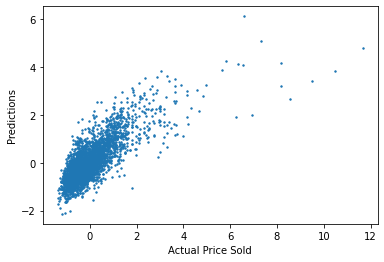

In [357]:
plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.show()

In [358]:
y_test=y_test*299847 + 504537

In [359]:
preds=preds*299847 + 504537

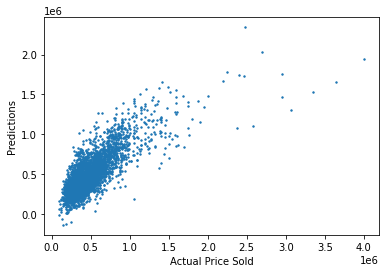

In [360]:
plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.show()

In [362]:
preds

array([[101778.90889442],
       [251065.6733914 ],
       [501354.91088326],
       ...,
       [201671.62314641],
       [487163.2284784 ],
       [312716.94015437]])

In [363]:
#prices[prices['selling_price']>5]

In [364]:
preds[X_test['standardized__sqft_living']>5]

array([[1762436.10823488],
       [2035446.53064823],
       [2343111.72113085],
       [1737428.50767231],
       [1938623.84412146],
       [1464665.50901914]])

In [365]:
np.corrcoef(np.squeeze(preds), y_test)

array([[1.        , 0.78939693],
       [0.78939693, 1.        ]])

In [366]:
#That is not a very good correlation!

In [367]:
y_test.shape

(3038,)

In [368]:
y_test

7184    324989.511815
9047    239985.004527
8978    520499.878577
6417    211983.519774
8586    361991.473811
            ...      
1485    249985.534796
5714    704009.609016
7848    239985.004527
4523    283987.337712
8437    219983.943989
Name: selling_price, Length: 3038, dtype: float64

In [369]:
preds

array([[101778.90889442],
       [251065.6733914 ],
       [501354.91088326],
       ...,
       [201671.62314641],
       [487163.2284784 ],
       [312716.94015437]])

# Evaluate this model

# we should evaluate this model in $10,000 increments of the asking prices

In [370]:
# GARRRRRR -- indexes are killing me!
y_test_merge=y_test.reset_index()
y_test_merge =y_test_merge.drop(columns=['index'])
y_test_merge


,selling_price
0,324989.511815
1,239985.004527
2,520499.878577
3,211983.519774
4,361991.473811
...,...
3033,249985.534796
3034,704009.609016
3035,239985.004527
3036,283987.337712


In [371]:
eval = pd.concat([pd.DataFrame(y_test_merge), pd.DataFrame(preds)], axis=1)

In [372]:
eval.columns = ['selling_price','prediction']
eval

,selling_price,prediction
0,324989.511815,101778.908894
1,239985.004527,251065.673391
2,520499.878577,501354.910883
3,211983.519774,269952.770771
4,361991.473811,340805.202445
...,...,...
3033,249985.534796,152443.409731
3034,704009.609016,695873.114412
3035,239985.004527,201671.623146
3036,283987.337712,487163.228478


In [373]:
eval=eval[eval['selling_price']<2000000]
eval=eval[eval['prediction']<2000000]

In [374]:
eval['x_minus_y_sq'] = (eval['selling_price'] - eval['prediction'])**2
eval

,selling_price,prediction,x_minus_y_sq
0,324989.511815,101778.908894,4.982297e+10
1,239985.004527,251065.673391,1.227812e+08
2,520499.878577,501354.910883,3.665298e+08
3,211983.519774,269952.770771,3.360434e+09
4,361991.473811,340805.202445,4.488581e+08
...,...,...,...
3033,249985.534796,152443.409731,9.514466e+09
3034,704009.609016,695873.114412,6.620254e+07
3035,239985.004527,201671.623146,1.467915e+09
3036,283987.337712,487163.228478,4.128044e+10


In [375]:
pd.set_option('display.max_rows', None)
eval.head(100)


,selling_price,prediction,x_minus_y_sq
0,3.249895e+05,1.017789e+05,4.982297e+10
1,2.399850e+05,2.510657e+05,1.227812e+08
2,5.204999e+05,5.013549e+05,3.665298e+08
3,2.119835e+05,2.699528e+05,3.360434e+09
4,3.619915e+05,3.408052e+05,4.488581e+08
5,1.924825e+05,2.639089e+05,5.101733e+09
6,3.499908e+05,1.803663e+05,2.877247e+10
7,7.600126e+05,8.046709e+05,1.994368e+09
8,2.699366e+05,4.070967e+05,1.881291e+10
9,3.979434e+05,6.458752e+05,6.147020e+10


In [376]:
pd.reset_option('display.max_rows')

In [377]:
eval['selling_price']=eval['selling_price'].round(-4)

In [378]:
eval

,selling_price,prediction,x_minus_y_sq
0,320000.0,101778.908894,4.982297e+10
1,240000.0,251065.673391,1.227812e+08
2,520000.0,501354.910883,3.665298e+08
3,210000.0,269952.770771,3.360434e+09
4,360000.0,340805.202445,4.488581e+08
...,...,...,...
3033,250000.0,152443.409731,9.514466e+09
3034,700000.0,695873.114412,6.620254e+07
3035,240000.0,201671.623146,1.467915e+09
3036,280000.0,487163.228478,4.128044e+10


In [379]:
result = eval.groupby('selling_price').agg(
    count=('selling_price', 'size'),
    average_Y=('prediction', 'mean'),
    sum_resid_sq=('x_minus_y_sq', 'sum')
)
result

,count,average_Y,sum_resid_sq
selling_price,,,
100000.0,3,7.324866e+04,1.841764e+10
110000.0,3,1.143528e+05,1.579988e+10
120000.0,3,9.559267e+04,1.165498e+10
130000.0,4,1.875331e+05,9.794428e+10
140000.0,8,2.421094e+05,1.249470e+11
...,...,...,...
1760000.0,1,9.905732e+05,5.921186e+11
1800000.0,1,1.193494e+06,3.679316e+11
1880000.0,1,1.423647e+06,2.083234e+11


In [380]:
pd.set_option('display.max_rows', None)
result

,count,average_Y,sum_resid_sq
selling_price,,,
100000.0,3,7.324866e+04,1.841764e+10
110000.0,3,1.143528e+05,1.579988e+10
120000.0,3,9.559267e+04,1.165498e+10
130000.0,4,1.875331e+05,9.794428e+10
140000.0,8,2.421094e+05,1.249470e+11
150000.0,8,1.506951e+05,1.230053e+11
160000.0,13,2.688811e+05,2.244975e+11
170000.0,16,2.808762e+05,2.925993e+11
180000.0,19,2.250597e+05,2.689868e+11


<AxesSubplot:xlabel='selling_price', ylabel='coef'>

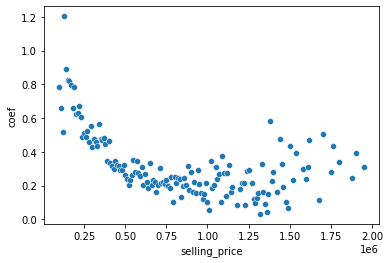

In [381]:
result['selling_price']=result.index

result['coef']=((result['sum_resid_sq']/result['count'])**0.5)/result['selling_price']

sns.scatterplot(data=result,x='selling_price',y='coef')

In [249]:
# I am looking at the data in a google chart
# I am clearly UNDERPRICING high value properties
# and OVER-PRICING low value propertiers

In [250]:
cols = ['standardized__bedrooms','standardized__bathrooms','standardized__sqft_living','standardized__sqft_lot','standardized__grade','standardized__sqft_above','standardized__yr_built']
to_sell[cols] = to_sell[cols].apply(lambda x: x.astype(float))


In [251]:
# hey don't forget to predict my houses!!!
price_em = pricing.predict(to_sell)

# I am going to build my own CUSTOM Activation function

In [65]:
import tensorflow as tf

In [66]:
def quadratic_activation(x):
    return tf.math.square(x)  # this just squares the input tensor

In [67]:
X_train.shape

(6166, 29)

In [68]:
# Creating our model
quad = Sequential()
# First hidden layer. Note here we also add the input layer of size 60.
quad.add(Dense(12, input_dim=29, activation=quadratic_activation)) 
# double sigmoid?
quad.add(Dense(12, activation=quadratic_activation)) 
# Output layer
quad.add(Dense(1, activation=quadratic_activation))

# compile
quad.compile(optimizer='adam', 
              loss='MeanSquaredError', 
              metrics=['MeanAbsolutePercentageError'])

In [69]:
quad.fit(X_train, y_train, epochs=70)


Epoch 1/70
193/193 [==============================] - 0s 1ms/step - loss: 368060891136.0000 - mean_absolute_percentage_error: 100.2553
Epoch 2/70
193/193 [==============================] - 0s 1ms/step - loss: 337730273280.0000 - mean_absolute_percentage_error: 99.9909
Epoch 3/70
193/193 [==============================] - 0s 1ms/step - loss: 337653071872.0000 - mean_absolute_percentage_error: 99.9862
Epoch 4/70
193/193 [==============================] - 0s 1ms/step - loss: 337477795840.0000 - mean_absolute_percentage_error: 99.9801
Epoch 5/70
193/193 [==============================] - 0s 1ms/step - loss: 335640002560.0000 - mean_absolute_percentage_error: 99.9411
Epoch 6/70
193/193 [==============================] - 0s 1ms/step - loss: 411103887360.0000 - mean_absolute_percentage_error: 99.7408
Epoch 7/70
193/193 [==============================] - 0s 1ms/step - loss: 325874712576.0000 - mean_absolute_percentage_error: 99.7116
Epoch 8/70
193/193 [==============================] - 0s 1ms/

Epoch 62/70
193/193 [==============================] - 0s 1ms/step - loss: 29238845440.0000 - mean_absolute_percentage_error: 26.8173
Epoch 63/70
193/193 [==============================] - 0s 1ms/step - loss: 29247191040.0000 - mean_absolute_percentage_error: 27.0087
Epoch 64/70
193/193 [==============================] - 0s 1ms/step - loss: 28978765824.0000 - mean_absolute_percentage_error: 27.0472
Epoch 65/70
193/193 [==============================] - 0s 1ms/step - loss: 28993839104.0000 - mean_absolute_percentage_error: 26.8262
Epoch 66/70
193/193 [==============================] - 0s 1ms/step - loss: 28846327808.0000 - mean_absolute_percentage_error: 26.9481
Epoch 67/70
193/193 [==============================] - 0s 1ms/step - loss: 29093943296.0000 - mean_absolute_percentage_error: 27.0495
Epoch 68/70
193/193 [==============================] - 0s 1ms/step - loss: 28755562496.0000 - mean_absolute_percentage_error: 26.7165
Epoch 69/70
193/193 [==============================] - 0s 1ms/

In [73]:
# predict
preds = quad.predict(X_test)


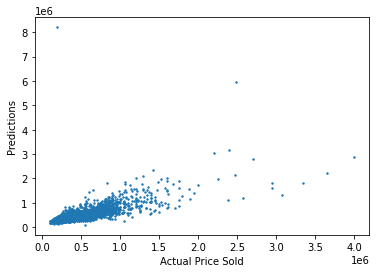

In [74]:

plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.show()

In [75]:
#ok that is one random outlier over there

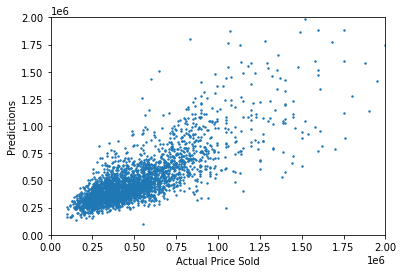

In [76]:
plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.axis([0, 2000000, 0, 2000000])
plt.show()

In [77]:
np.corrcoef(np.squeeze(preds), y_test)

array([[1.        , 0.70357182],
       [0.70357182, 1.        ]])

In [78]:
# GARRRRRR -- indexes are killing me!
y_test_merge=y_test.reset_index()
y_test_merge =y_test_merge.drop(columns=['index'])
y_test_merge


eval = pd.concat([pd.DataFrame(y_test_merge), pd.DataFrame(preds)], axis=1)



In [79]:
eval.columns = ['selling_price','prediction']


In [80]:
eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3038 entries, 0 to 3037
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   selling_price  3038 non-null   float64
 1   prediction     3038 non-null   float32
dtypes: float32(1), float64(1)
memory usage: 35.7 KB


In [81]:
eval=eval[eval['selling_price']<2000000]
eval=eval[eval['prediction']<2000000]


In [82]:
correlation = eval['selling_price'].corr(eval['prediction'])
correlation

0.7863271531007008

In [83]:
# OK!

In [84]:

eval['x_minus_y_sq'] = (eval['selling_price'] - eval['prediction'])**2

pd.set_option('display.max_rows', None)
eval.head(100)


,selling_price,prediction,x_minus_y_sq
0,325000.0,2.517084e+05,5.371660e+09
1,240000.0,2.884039e+05,2.342935e+09
2,520500.0,4.582486e+05,3.875238e+09
3,212000.0,3.038738e+05,8.440786e+09
4,362000.0,3.320717e+05,8.957020e+08
5,192500.0,2.952667e+05,1.056099e+10
6,350000.0,2.651010e+05,7.207846e+09
7,760000.0,8.506681e+05,8.220709e+09
8,269950.0,4.045752e+05,1.812394e+10
9,397950.0,5.970678e+05,3.964788e+10


In [85]:
eval['selling_price']=eval['selling_price'].round(-4)

result = eval.groupby('selling_price').agg(
    count=('selling_price', 'size'),
    average_Y=('prediction', 'mean'),
    sum_resid_sq=('x_minus_y_sq', 'sum')
)
pd.set_option('display.max_rows', None)
result

,count,average_Y,sum_resid_sq
selling_price,,,
100000.0,3,2.037714e+05,3.687653e+10
110000.0,1,2.397440e+05,1.762098e+10
120000.0,5,2.084280e+05,5.243223e+10
130000.0,4,2.709494e+05,9.208802e+10
140000.0,8,2.810903e+05,1.653998e+11
150000.0,7,2.508682e+05,9.398536e+10
160000.0,14,2.879755e+05,2.566045e+11
170000.0,10,2.995706e+05,1.881068e+11
180000.0,25,2.932396e+05,4.320057e+11


In [86]:
result['selling_price']=result.index

In [87]:
result['coef']=((result['sum_resid_sq']/result['count'])**0.5)/result['selling_price']

<AxesSubplot:xlabel='selling_price', ylabel='coef'>

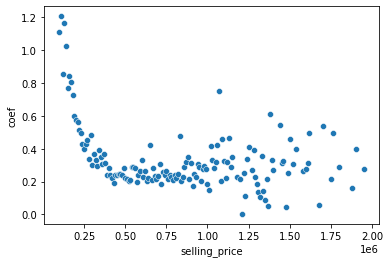

In [88]:
sns.scatterplot(data=result,x='selling_price',y='coef')

In [89]:
price_em = quad.predict(to_sell)

In [90]:
price_em

array([[1095464.8 ],
       [1618322.2 ],
       [ 509447.88],
       [1707582.8 ],
       [1338095.8 ]], dtype=float32)

In [91]:
to_sell

,standardized__bedrooms,standardized__bathrooms,standardized__sqft_living,standardized__sqft_lot,standardized__grade,standardized__sqft_above,standardized__yr_built,remainder__heating_electric,remainder__heating_gas,remainder__heating_oil,...,remainder__floors_2.5,remainder__floors_3.0,remainder__floors_3.5,remainder__condition_average,remainder__condition_fair,remainder__condition_good,remainder__condition_poor,remainder__condition_very good,remainder__renovated_No,remainder__renovated_Yes
9204,1.937611,2.978426,2.384899,-0.166228,2.166428,2.844953,1.475217,0,0,1,...,0,0,0,1,0,0,0,0,1,0
9205,0.782171,1.615646,2.504002,0.042245,3.063488,2.971066,0.790391,0,1,0,...,0,0,0,1,0,0,0,0,1,0
9206,1.937611,1.274951,0.777004,-0.182131,-0.524755,-0.106094,-0.339572,0,1,0,...,0,0,0,0,0,1,0,0,1,0
9207,-0.373269,0.593562,2.384899,-0.055221,3.063488,1.066758,0.379495,0,0,0,...,0,0,0,0,0,0,0,1,1,0
9208,-0.373269,1.615646,3.230532,0.531419,2.166428,1.810826,0.893114,1,0,0,...,0,0,0,1,0,0,0,0,1,0


In [92]:
orig=pd.read_csv('houses_to_sell.csv')
orig

,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated
0,5,4.25,oil,4010,8252,2.0,poor,average,10,4010,2015,0.0
1,4,3.25,gas,4110,15488,2.0,average,average,11,4110,1995,0.0
2,5,3.00,gas,2660,7700,1.5,poor,good,7,1670,1962,0.0
3,3,2.50,other,4010,12105,1.0,good,very good,11,2600,1983,0.0
4,3,3.25,electric,4720,32467,2.0,average,average,10,3190,1998,0.0


# what about polynomial?

In [96]:
def polynomial_activation(x):
    a = tf.constant(1.0)
    b = tf.constant(-2.0)
    c = tf.constant(3.0)
    return a * tf.square(x) + b * x + c

In [97]:
# Creating our model
poly = Sequential()
# First hidden layer. Note here we also add the input layer of size 60.
poly.add(Dense(12, input_dim=29, activation=polynomial_activation)) 
# double sigmoid?
poly.add(Dense(12, activation=polynomial_activation)) 
# Output layer
poly.add(Dense(1, activation=polynomial_activation))

# compile
poly.compile(optimizer='adam', 
              loss='MeanSquaredError', 
              metrics=['MeanAbsolutePercentageError'])

In [98]:
poly.fit(X_train, y_train, epochs=70)

preds = poly.predict(X_test)


Epoch 1/70
193/193 [==============================] - 1s 1ms/step - loss: 355292446720.0000 - mean_absolute_percentage_error: 99.9858
Epoch 2/70
193/193 [==============================] - 0s 1ms/step - loss: 335503884288.0000 - mean_absolute_percentage_error: 98.6950
Epoch 3/70
193/193 [==============================] - 0s 1ms/step - loss: 646865813504.0000 - mean_absolute_percentage_error: 71.0923
Epoch 4/70
193/193 [==============================] - 0s 1ms/step - loss: 158322081792.0000 - mean_absolute_percentage_error: 57.9056
Epoch 5/70
193/193 [==============================] - 0s 1ms/step - loss: 139353817088.0000 - mean_absolute_percentage_error: 55.1929
Epoch 6/70
193/193 [==============================] - 0s 1ms/step - loss: 128988561408.0000 - mean_absolute_percentage_error: 52.9290
Epoch 7/70
193/193 [==============================] - 0s 1ms/step - loss: 115828301824.0000 - mean_absolute_percentage_error: 50.9358
Epoch 8/70
193/193 [==============================] - 0s 1ms/s

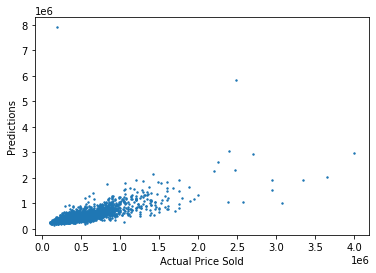

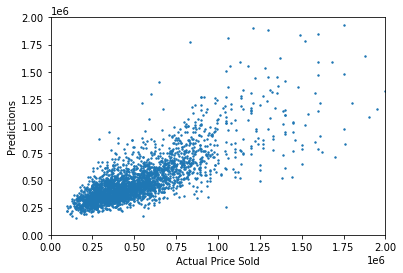

In [99]:

plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.show()

plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.axis([0, 2000000, 0, 2000000])
plt.show()

np.corrcoef(np.squeeze(preds), y_test)

# GARRRRRR -- indexes are killing me!
y_test_merge=y_test.reset_index()
y_test_merge =y_test_merge.drop(columns=['index'])
y_test_merge


eval = pd.concat([pd.DataFrame(y_test_merge), pd.DataFrame(preds)], axis=1)


0.7855063717095275


<AxesSubplot:xlabel='selling_price', ylabel='coef'>

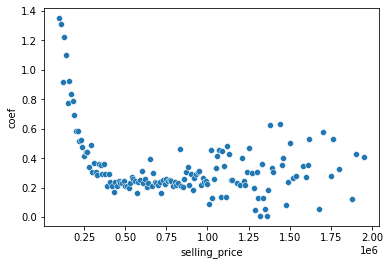

In [100]:

eval.columns = ['selling_price','prediction']
eval=eval[eval['selling_price']<2000000]
eval=eval[eval['prediction']<2000000]
correlation = eval['selling_price'].corr(eval['prediction'])
print(correlation)

eval['x_minus_y_sq'] = (eval['selling_price'] - eval['prediction'])**2

eval['selling_price']=eval['selling_price'].round(-4)

result = eval.groupby('selling_price').agg(
    count=('selling_price', 'size'),
    average_Y=('prediction', 'mean'),
    sum_resid_sq=('x_minus_y_sq', 'sum')
)
pd.set_option('display.max_rows', None)
result

result['selling_price']=result.index

result['coef']=((result['sum_resid_sq']/result['count'])**0.5)/result['selling_price']

sns.scatterplot(data=result,x='selling_price',y='coef')

In [101]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6166 entries, 1950 to 8574
Data columns (total 29 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   standardized__bedrooms          6166 non-null   float64
 1   standardized__bathrooms         6166 non-null   float64
 2   standardized__sqft_living       6166 non-null   float64
 3   standardized__sqft_lot          6166 non-null   float64
 4   standardized__grade             6166 non-null   float64
 5   standardized__sqft_above        6166 non-null   float64
 6   standardized__yr_built          6166 non-null   float64
 7   remainder__heating_electric     6166 non-null   uint8  
 8   remainder__heating_gas          6166 non-null   uint8  
 9   remainder__heating_oil          6166 non-null   uint8  
 10  remainder__heating_other        6166 non-null   uint8  
 11  remainder__view_average         6166 non-null   uint8  
 12  remainder__view_fair           

# Activation functions are NOT CUTTING IT

FUll BLAST feature engineering

In [102]:
prices=pd.read_csv('historical_prices.csv')

to_sell=pd.read_csv('houses_to_sell.csv')
to_sell['to_sell']="to_sell"

prices=pd.concat([prices,to_sell])



In [103]:

prices.loc[prices['yr_renovated'] > 0, 'renovated'] = 'Yes'
prices.loc[prices['yr_renovated'] == 0, 'renovated'] = 'No'
prices['renovated'].value_counts()
prices=prices.drop(columns=['yr_renovated'])


In [104]:

prices = pd.get_dummies(prices, columns=['heating', 'view', 'floors', 'condition', 'renovated','bedrooms','bathrooms','grade'])


In [105]:

to_sell = prices[prices['to_sell'] =='to_sell']
to_sell
to_sell = to_sell.drop(columns=['to_sell'])

prices = prices[prices['to_sell'] !='to_sell']
prices
prices = prices.drop(columns=['to_sell'])

In [106]:
pd.reset_option('display.max_rows')


In [107]:
prices['selling_price'] = np.log(prices['selling_price'])
prices['sqft_living'] = np.log(prices['sqft_living'])
prices['sqft_lot'] = np.log(prices['sqft_lot'])
prices['sqft_above'] = np.log(prices['sqft_above'])
prices['yr_built'] = np.log(prices['yr_built'])

In [108]:
X=prices.drop(columns=['selling_price'])
Y=prices['selling_price']
# Test/Train split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=9)

In [109]:
y_train=y_train.astype(float)
y_test=y_test.astype(float)


In [110]:
X_train.shape

(6166, 69)

In [111]:

# Creating our model
pricing = Sequential()
# First hidden layer. Note here we also add the input layer of size 60.
pricing.add(Dense(12, input_dim=69, activation= "linear")) 
# Second hidden layer
pricing.add(Dense(12, activation= "linear"))
# Output layer
pricing.add(Dense(1, activation='linear'))

# compile
pricing.compile(optimizer='adam', 
              loss='MeanSquaredError', 
              metrics=['MeanAbsolutePercentageError'])







In [112]:
pricing.fit(X_train, y_train, epochs=70)


Epoch 1/70
193/193 [==============================] - 0s 1ms/step - loss: 13.7895 - mean_absolute_percentage_error: 15.4471
Epoch 2/70
193/193 [==============================] - 0s 1ms/step - loss: 0.3378 - mean_absolute_percentage_error: 3.5842
Epoch 3/70
193/193 [==============================] - 0s 1ms/step - loss: 0.2351 - mean_absolute_percentage_error: 2.9920
Epoch 4/70
193/193 [==============================] - 0s 996us/step - loss: 0.1875 - mean_absolute_percentage_error: 2.6864
Epoch 5/70
193/193 [==============================] - 0s 992us/step - loss: 0.1687 - mean_absolute_percentage_error: 2.5477
Epoch 6/70
193/193 [==============================] - 0s 1ms/step - loss: 0.1597 - mean_absolute_percentage_error: 2.4826
Epoch 7/70
193/193 [==============================] - 0s 999us/step - loss: 0.1520 - mean_absolute_percentage_error: 2.4214
Epoch 8/70
193/193 [==============================] - 0s 995us/step - loss: 0.1455 - mean_absolute_percentage_error: 2.3667
Epoch 9/70
193

In [113]:
preds = pricing.predict(X_test)


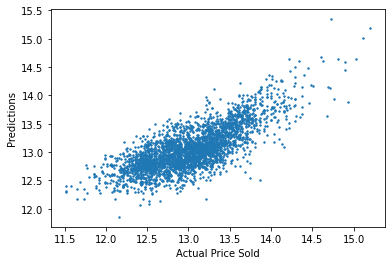

In [114]:

plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.show()

In [115]:
# GARRRRRR -- indexes are killing me!
y_test_merge=y_test.reset_index()
y_test_merge =y_test_merge.drop(columns=['index'])
y_test_merge


eval = pd.concat([pd.DataFrame(y_test_merge), pd.DataFrame(preds)], axis=1)
eval.columns = ['selling_price','prediction']


In [116]:
eval

,selling_price,prediction
0,12.691580,12.482063
1,12.388394,12.547988
2,13.162545,12.920201
3,12.264342,12.706791
4,12.799399,12.794191
...,...,...
3033,12.429216,12.440998
3034,13.464534,13.299069
3035,12.388394,12.622892
3036,12.556730,12.969438


In [117]:
eval['selling_price']=np.exp(eval['selling_price'])
eval['prediction']=np.exp(eval['prediction'])


In [118]:
correlation = eval['selling_price'].corr(eval['prediction'])
correlation


0.8039466901589453

<AxesSubplot:xlabel='selling_price', ylabel='coef'>

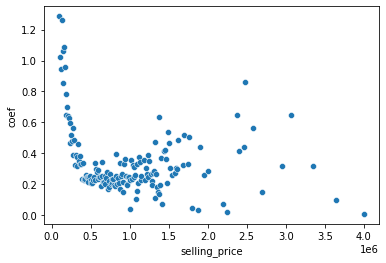

In [119]:

eval['x_minus_y_sq'] = (eval['selling_price'] - eval['prediction'])**2

eval['selling_price']=eval['selling_price'].round(-4)

result = eval.groupby('selling_price').agg(
    count=('selling_price', 'size'),
    average_Y=('prediction', 'mean'),
    sum_resid_sq=('x_minus_y_sq', 'sum')
)

result['selling_price']=result.index

result['coef']=((result['sum_resid_sq']/result['count'])**0.5)/result['selling_price']

sns.scatterplot(data=result,x='selling_price',y='coef')

# YOU ARE MAKING ME GO FULL NUCLEAR ON YOU, DATASET!

In [120]:
prices=pd.read_csv('historical_prices.csv')

to_sell=pd.read_csv('houses_to_sell.csv')
to_sell['to_sell']="to_sell"

prices=pd.concat([prices,to_sell])


In [121]:
prices.loc[prices['yr_renovated'] > 0, 'renovated'] = 'Yes'
prices.loc[prices['yr_renovated'] == 0, 'renovated'] = 'No'
prices['renovated'].value_counts()
prices=prices.drop(columns=['yr_renovated'])


In [122]:
prices['living_bins']=pd.qcut(prices['sqft_living'],q=50, labels=False)
prices=prices.drop(columns=['sqft_living'])

prices['lot_bins']=pd.qcut(prices['sqft_lot'],q=50, labels=False)
prices=prices.drop(columns=['sqft_lot'])

# I have had enough of "above"
prices=prices.drop(columns=['sqft_above'])


prices['built_bins']=pd.qcut(prices['yr_built'],q=25, labels=False)
prices=prices.drop(columns=['yr_built'])


In [123]:
prices.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9209 entries, 0 to 4
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   selling_price  9204 non-null   float64
 1   bedrooms       9209 non-null   int64  
 2   bathrooms      9209 non-null   float64
 3   heating        9209 non-null   object 
 4   floors         9209 non-null   float64
 5   view           9209 non-null   object 
 6   condition      9209 non-null   object 
 7   grade          9209 non-null   int64  
 8   to_sell        5 non-null      object 
 9   renovated      9209 non-null   object 
 10  living_bins    9209 non-null   int64  
 11  lot_bins       9209 non-null   int64  
 12  built_bins     9209 non-null   int64  
dtypes: float64(3), int64(5), object(5)
memory usage: 1007.2+ KB


In [124]:
prices = pd.get_dummies(prices, columns=['heating', 'view', 'floors', 'condition', 'renovated','bedrooms','bathrooms','grade','living_bins','lot_bins','built_bins'])


In [125]:

# the to sell dataset are the rows marked as such
to_sell = prices[prices['to_sell'] =='to_sell']
to_sell = to_sell.drop(columns=['to_sell'])

# the pricing dataset are the rows marked as such
prices = prices[prices['to_sell'] !='to_sell']
prices = prices.drop(columns=['to_sell'])



In [126]:
pd.reset_option('display.max_rows')


In [127]:

X=prices.drop(columns=['selling_price'])
Y=prices['selling_price']

# Test/Train split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=9)


In [128]:

y_train=y_train.astype(float)
y_test=y_test.astype(float)


In [129]:
X_train.shape


(6166, 190)

In [130]:

# Creating our model
pricing = Sequential()
# First hidden layer. Note here we also add the input layer of size 60.
pricing.add(Dense(12, input_dim=190, activation= "linear")) 
# Second hidden layer
pricing.add(Dense(12, activation= "linear"))
# Output layer
pricing.add(Dense(1, activation='linear'))

# compile
pricing.compile(optimizer='adam', 
              loss='MeanSquaredError', 
              metrics=['MeanAbsolutePercentageError'])



In [131]:
pricing.fit(X_train, y_train, epochs=70)


Epoch 1/70
193/193 [==============================] - 1s 1ms/step - loss: 337859510272.0000 - mean_absolute_percentage_error: 99.9935
Epoch 2/70
193/193 [==============================] - 0s 1ms/step - loss: 337547821056.0000 - mean_absolute_percentage_error: 99.9132
Epoch 3/70
193/193 [==============================] - 0s 1ms/step - loss: 336447242240.0000 - mean_absolute_percentage_error: 99.6285
Epoch 4/70
193/193 [==============================] - 0s 1ms/step - loss: 334107508736.0000 - mean_absolute_percentage_error: 99.0232
Epoch 5/70
193/193 [==============================] - 0s 1ms/step - loss: 330197434368.0000 - mean_absolute_percentage_error: 97.9984
Epoch 6/70
193/193 [==============================] - 0s 1ms/step - loss: 324486430720.0000 - mean_absolute_percentage_error: 96.4995
Epoch 7/70
193/193 [==============================] - 0s 1ms/step - loss: 316854501376.0000 - mean_absolute_percentage_error: 94.4548
Epoch 8/70
193/193 [==============================] - 0s 1ms/s

193/193 [==============================] - 0s 1ms/step - loss: 61680746496.0000 - mean_absolute_percentage_error: 37.0113
Epoch 63/70
193/193 [==============================] - 0s 1ms/step - loss: 61224169472.0000 - mean_absolute_percentage_error: 36.6035
Epoch 64/70
193/193 [==============================] - 0s 1ms/step - loss: 60765999104.0000 - mean_absolute_percentage_error: 36.5508
Epoch 65/70
193/193 [==============================] - 0s 1ms/step - loss: 60328714240.0000 - mean_absolute_percentage_error: 36.3269
Epoch 66/70
193/193 [==============================] - 0s 1ms/step - loss: 59900198912.0000 - mean_absolute_percentage_error: 36.1749
Epoch 67/70
193/193 [==============================] - 0s 1ms/step - loss: 59474239488.0000 - mean_absolute_percentage_error: 35.8684
Epoch 68/70
193/193 [==============================] - 0s 1ms/step - loss: 59053105152.0000 - mean_absolute_percentage_error: 35.8415
Epoch 69/70
193/193 [==============================] - 0s 1ms/step - loss:

In [132]:
preds = pricing.predict(X_test)


In [150]:
preds

array([[251708.39],
       [288403.88],
       [458248.6 ],
       ...,
       [284802.22],
       [431962.97],
       [311871.06]], dtype=float32)

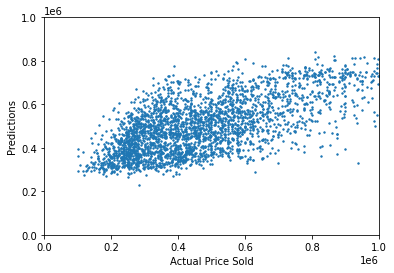

In [133]:

plt.scatter(y_test, preds,s=2)
plt.xlabel('Actual Price Sold')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.axis([0, 1000000, 0, 1000000])
plt.show()


In [134]:


# GARRRRRR -- indexes are killing me!
y_test_merge=y_test.reset_index()
y_test_merge =y_test_merge.drop(columns=['index'])
y_test_merge


eval = pd.concat([pd.DataFrame(y_test_merge), pd.DataFrame(preds)], axis=1)
eval.columns = ['selling_price','prediction']




correlation = eval['selling_price'].corr(eval['prediction'])
correlation


0.5902304971336014

<AxesSubplot:xlabel='selling_price', ylabel='coef'>

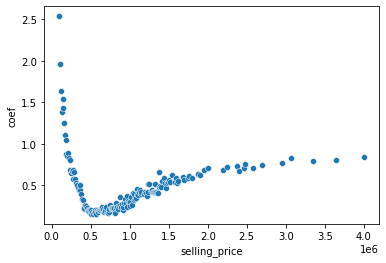

In [135]:


eval['x_minus_y_sq'] = (eval['selling_price'] - eval['prediction'])**2

eval['selling_price']=eval['selling_price'].round(-4)

result = eval.groupby('selling_price').agg(
    count=('selling_price', 'size'),
    average_Y=('prediction', 'mean'),
    sum_resid_sq=('x_minus_y_sq', 'sum')
)

result['selling_price']=result.index

result['coef']=((result['sum_resid_sq']/result['count'])**0.5)/result['selling_price']

sns.scatterplot(data=result,x='selling_price',y='coef')

In [136]:
# wholly cow even WORSE!!!!!

In [137]:
to_sell

,selling_price,heating_electric,heating_gas,heating_oil,heating_other,view_average,view_fair,view_good,view_poor,view_very good,...,built_bins_15,built_bins_16,built_bins_17,built_bins_18,built_bins_19,built_bins_20,built_bins_21,built_bins_22,built_bins_23,built_bins_24
0,NaN,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
1,NaN,0,1,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,NaN,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,NaN,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,NaN,1,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


# time-to-sell model

In [93]:
time = pd.read_csv('housing_status.csv')

In [94]:
to_sell = pd.read_csv('houses_to_sell.csv')

In [95]:
price_em=pd.DataFrame(price_em, columns=['asking_price'])

In [96]:
to_sell = pd.concat([to_sell, price_em], axis=1)
to_sell.tail(10)

,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated,asking_price
0,5,4.25,oil,4010,8252,2.0,poor,average,10,4010,2015,0.0,1095464.750
1,4,3.25,gas,4110,15488,2.0,average,average,11,4110,1995,0.0,1618322.250
2,5,3.00,gas,2660,7700,1.5,poor,good,7,1670,1962,0.0,509447.875
3,3,2.50,other,4010,12105,1.0,good,very good,11,2600,1983,0.0,1707582.750
4,3,3.25,electric,4720,32467,2.0,average,average,10,3190,1998,0.0,1338095.750


In [97]:
to_sell['to_sell']="to_sell"
# mark my dataframe

In [98]:
time=pd.concat([time,to_sell])

In [99]:
time.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11597 entries, 0 to 4
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sold_in_30       11592 non-null  float64
 1   status           11592 non-null  object 
 2   days_until_sold  11592 non-null  float64
 3   asking_price     11597 non-null  float64
 4   bedrooms         11597 non-null  int64  
 5   bathrooms        11597 non-null  float64
 6   heating          11597 non-null  object 
 7   sqft_living      11597 non-null  int64  
 8   sqft_lot         11597 non-null  int64  
 9   floors           11597 non-null  float64
 10  view             11597 non-null  object 
 11  condition        11597 non-null  object 
 12  grade            11597 non-null  int64  
 13  sqft_above       11597 non-null  int64  
 14  yr_built         11597 non-null  int64  
 15  yr_renovated     11597 non-null  float64
 16  to_sell          5 non-null      object 
dtypes: float64(6), i

In [100]:
# renovated
time.loc[time['yr_renovated'] > 0, 'renovated'] = 'Yes'
time.loc[time['yr_renovated'] == 0, 'renovated'] = 'No'
time['renovated'].value_counts()
time=time.drop(columns=['yr_renovated'])

In [101]:
# standardize
# NEW THING HERE! Asking price
numerical_cols = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'grade', 'sqft_above', 'yr_built', 'asking_price']

col_transformer = ColumnTransformer([('standardized', StandardScaler(), numerical_cols)], remainder='passthrough')

time = col_transformer.fit_transform(time)
time = pd.DataFrame(time, columns = col_transformer.get_feature_names_out())

In [102]:
# dummy variables
time = pd.get_dummies(time, columns=['remainder__heating', 'remainder__view', 'remainder__floors', 'remainder__condition', 'remainder__renovated'])

/usr/local/lib/python3.8/site-packages/pandas/core/algorithms.py:794: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)


In [103]:
# OK I have houses to sell
to_sell = time[time['remainder__to_sell'] =='to_sell']
to_sell = to_sell.drop(columns=['remainder__to_sell'])

# Ok and this is my dataframe to model with
time = time[time['remainder__to_sell'] !='to_sell']
time = time.drop(columns=['remainder__to_sell'])

In [104]:
time = time.rename(columns={'remainder__days_until_sold': 'days_until_sold'})


In [105]:
time['30'] = (time['days_until_sold'] <= 30).astype(int)
time['60'] = (time['days_until_sold'] <= 60).astype(int)
time['90'] = (time['days_until_sold'] <= 90).astype(int)

In [106]:
time.head(20)

,standardized__bedrooms,standardized__bathrooms,standardized__sqft_living,standardized__sqft_lot,standardized__grade,standardized__sqft_above,standardized__yr_built,standardized__asking_price,remainder__sold_in_30,remainder__status,...,remainder__condition_3,remainder__condition_4,remainder__condition_average,remainder__condition_good,remainder__condition_very good,remainder__renovated_No,remainder__renovated_Yes,30,60,90
0,-0.391218,-1.448031,-0.980622,-0.219396,-0.556371,-0.730472,-0.547751,-0.878661,1.0,sold in 30 days,...,0,0,0,0,0,1,0,1,1,1
1,-0.391218,0.175279,0.538563,-0.183718,-0.556371,0.472801,-0.684043,-0.00382,0.0,sold after 30 days,...,0,0,0,0,0,0,1,0,0,0
2,-0.391218,-0.149383,-0.434153,-0.164937,0.29395,-0.122758,0.54258,-0.081313,0.0,sold after 30 days,...,0,0,0,0,0,1,0,0,0,1
3,-0.391218,-0.798707,-1.111775,-0.128384,-0.556371,-0.876323,-0.275168,-0.685067,1.0,sold in 30 days,...,0,0,0,0,0,1,0,1,1,1
4,-1.442899,-1.448031,-1.002481,-0.211553,-0.556371,-1.119409,-0.990698,-0.197553,1.0,sold in 30 days,...,1,0,0,0,0,1,0,1,1,1
5,-0.391218,-1.448031,-0.707387,0.099987,-0.556371,-0.426615,-1.501791,-0.634835,1.0,sold in 30 days,...,1,0,0,0,0,1,0,1,1,1
6,1.712144,-0.149383,-0.292071,-0.237325,-0.556371,0.035247,-2.421759,-0.025961,0.0,sold after 30 days,...,0,0,0,0,0,1,0,0,0,1
7,0.660463,1.149265,0.95388,-0.233964,1.14427,0.24187,0.269997,0.306152,0.0,sold after 30 days,...,0,0,0,0,0,1,0,0,0,0
8,-0.391218,-0.149383,-0.204636,-0.031366,-0.556371,0.132481,0.78109,-0.399588,1.0,sold in 30 days,...,0,0,0,0,0,1,0,1,1,1
9,0.660463,-1.448031,-0.521588,-0.249652,-0.556371,-0.219992,-1.876593,-0.150503,1.0,sold in 30 days,...,1,0,0,0,0,1,0,1,1,1


In [107]:
time = time.drop(columns=['remainder__sold_in_30','remainder__status'])

In [108]:
# let me generate this intermediate data file that I can play with
timer = time

In [113]:
# timer.info()

In [143]:
cols = ['days_until_sold','standardized__bedrooms','standardized__bathrooms','standardized__sqft_living','standardized__sqft_lot','standardized__grade','standardized__sqft_above','standardized__yr_built','standardized__asking_price']
timer[cols] = timer[cols].apply(lambda x: x.astype(float))
to_sell[cols] = to_sell[cols].apply(lambda x: x.astype(float))

<ipython-input-143-c149ba11852b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  timer[cols] = timer[cols].apply(lambda x: x.astype(float))


KeyError: "['days_until_sold'] not in index"

In [116]:
timer.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11592 entries, 0 to 11591
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   standardized__bedrooms          11592 non-null  float64
 1   standardized__bathrooms         11592 non-null  float64
 2   standardized__sqft_living       11592 non-null  float64
 3   standardized__sqft_lot          11592 non-null  float64
 4   standardized__grade             11592 non-null  float64
 5   standardized__sqft_above        11592 non-null  float64
 6   standardized__yr_built          11592 non-null  float64
 7   standardized__asking_price      11592 non-null  float64
 8   days_until_sold                 11592 non-null  float64
 9   remainder__heating_electric     11592 non-null  uint8  
 10  remainder__heating_gas          11592 non-null  uint8  
 11  remainder__heating_oil          11592 non-null  uint8  
 12  remainder__heating_other        

# MODEL A - straight time to sell

In [127]:
timer=timer[timer['days_until_sold']<150]

In [128]:
# X and Y, test/train split
X=timer.drop(columns=['days_until_sold','30','60','90'])
Y=timer['days_until_sold']

# Test/Train split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=12)

In [129]:
X_train.shape

(7238, 36)

In [134]:
# Creating our model
timex = Sequential()
# First hidden layer. Note here we also add the input layer of size 60.
timex.add(Dense(12, input_dim=36, activation= "sigmoid")) 
# Second hidden layer
timex.add(Dense(12, activation= "sigmoid"))
# Output layer
timex.add(Dense(1, activation='linear'))

# compile
timex.compile(optimizer='adam', 
              loss='MeanSquaredError', 
              metrics=['MeanAbsolutePercentageError'])

In [135]:
timex.fit(X_train, y_train, epochs=70)

Epoch 1/70
227/227 [==============================] - 1s 1ms/step - loss: 1864.7878 - mean_absolute_percentage_error: 202002.1562
Epoch 2/70
227/227 [==============================] - 0s 1ms/step - loss: 1659.9803 - mean_absolute_percentage_error: 916292.2500
Epoch 3/70
227/227 [==============================] - 0s 1ms/step - loss: 1527.8123 - mean_absolute_percentage_error: 1195335.7500
Epoch 4/70
227/227 [==============================] - 0s 995us/step - loss: 1422.7355 - mean_absolute_percentage_error: 1622256.2500
Epoch 5/70
227/227 [==============================] - 0s 996us/step - loss: 1333.4021 - mean_absolute_percentage_error: 1760851.8750
Epoch 6/70
227/227 [==============================] - 0s 1ms/step - loss: 1256.6248 - mean_absolute_percentage_error: 2049136.3750
Epoch 7/70
227/227 [==============================] - 0s 1ms/step - loss: 1190.7582 - mean_absolute_percentage_error: 2194499.5000
Epoch 8/70
227/227 [==============================] - 0s 989us/step - loss: 1127.

Epoch 63/70
227/227 [==============================] - 0s 1ms/step - loss: 200.4513 - mean_absolute_percentage_error: 1929298.2500
Epoch 64/70
227/227 [==============================] - 0s 1ms/step - loss: 198.9289 - mean_absolute_percentage_error: 1913171.8750
Epoch 65/70
227/227 [==============================] - 0s 1ms/step - loss: 197.6552 - mean_absolute_percentage_error: 1888429.5000
Epoch 66/70
227/227 [==============================] - 0s 1ms/step - loss: 196.3957 - mean_absolute_percentage_error: 1874734.5000
Epoch 67/70
227/227 [==============================] - 0s 1ms/step - loss: 195.5878 - mean_absolute_percentage_error: 1883515.8750
Epoch 68/70
227/227 [==============================] - 0s 1ms/step - loss: 194.2202 - mean_absolute_percentage_error: 1862008.1250
Epoch 69/70
227/227 [==============================] - 0s 1ms/step - loss: 193.3644 - mean_absolute_percentage_error: 1851990.5000
Epoch 70/70
227/227 [==============================] - 0s 1ms/step - loss: 192.5728

In [136]:
predicted_times = timex.predict(X_test)

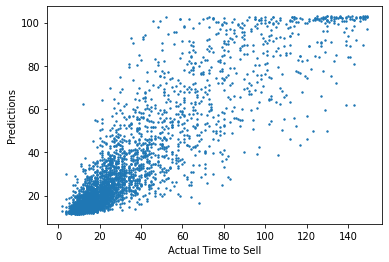

In [140]:
plt.scatter(y_test, predicted_times,s=2)
plt.xlabel('Actual Time to Sell')  # Label x axis
plt.ylabel('Predictions')  # Label y axis
plt.show()

<AxesSubplot:xlabel='time_to_sell', ylabel='coef'>

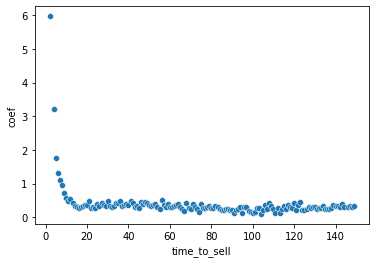

In [139]:
# GARRRRRR -- indexes are killing me!
y_test_merge=y_test.reset_index()
y_test_merge =y_test_merge.drop(columns=['index'])


eval = pd.concat([pd.DataFrame(y_test_merge), pd.DataFrame(predicted_times)], axis=1)
eval.columns = ['time_to_sell','prediction']




correlation = eval['time_to_sell'].corr(eval['prediction'])
correlation




eval['x_minus_y_sq'] = (eval['time_to_sell'] - eval['prediction'])**2

eval['time_to_sell']=eval['time_to_sell'].round(0)

result = eval.groupby('time_to_sell').agg(
    count=('time_to_sell', 'size'),
    average_Y=('prediction', 'mean'),
    sum_resid_sq=('x_minus_y_sq', 'sum')
)

result['time_to_sell']=result.index

result['coef']=((result['sum_resid_sq']/result['count'])**0.5)/result['time_to_sell']

sns.scatterplot(data=result,x='time_to_sell',y='coef')


<AxesSubplot:xlabel='time_to_sell', ylabel='coef'>

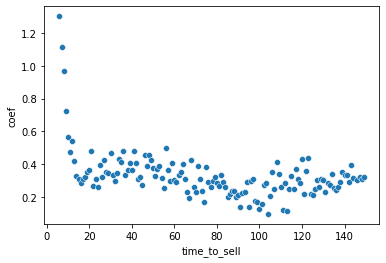

In [175]:
sns.scatterplot(data=result[result['time_to_sell']>5],x='time_to_sell',y='coef')


In [141]:
result

,count,average_Y,sum_resid_sq,time_to_sell,coef
time_to_sell,,,,,
2.0,2,13.899845,285.578503,2.0,5.974723
4.0,8,15.494869,1330.542185,4.0,3.224106
5.0,13,13.515681,999.529596,5.0,1.753703
6.0,22,13.633860,1346.283521,6.0,1.303784
7.0,44,14.315594,2695.630128,7.0,1.118165
8.0,52,14.978397,3145.604514,8.0,0.972211
9.0,73,14.778762,3113.745471,9.0,0.725667
10.0,105,15.031849,3347.536350,10.0,0.564635
11.0,139,15.092337,3832.718493,11.0,0.477368


In [147]:
cols = ['standardized__bedrooms','standardized__bathrooms','standardized__sqft_living','standardized__sqft_lot','standardized__grade','standardized__sqft_above','standardized__yr_built','standardized__asking_price']
to_sell[cols] = to_sell[cols].apply(lambda x: x.astype(float))
to_sell=to_sell.drop(columns=['remainder__sold_in_30','remainder__status','remainder__days_until_sold'])

modal_times = timex.predict(to_sell)

In [148]:
modal_times

array([[102.90106 ],
       [102.93327 ],
       [ 98.80303 ],
       [102.93138 ],
       [102.910995]], dtype=float32)

In [149]:
orig

,bedrooms,bathrooms,heating,sqft_living,sqft_lot,floors,view,condition,grade,sqft_above,yr_built,yr_renovated
0,5,4.25,oil,4010,8252,2.0,poor,average,10,4010,2015,0.0
1,4,3.25,gas,4110,15488,2.0,average,average,11,4110,1995,0.0
2,5,3.00,gas,2660,7700,1.5,poor,good,7,1670,1962,0.0
3,3,2.50,other,4010,12105,1.0,good,very good,11,2600,1983,0.0
4,3,3.25,electric,4720,32467,2.0,average,average,10,3190,1998,0.0


In [151]:
X_train

,standardized__bedrooms,standardized__bathrooms,standardized__sqft_living,standardized__sqft_lot,standardized__grade,standardized__sqft_above,standardized__yr_built,standardized__asking_price,remainder__heating_electric,remainder__heating_gas,...,remainder__condition_0,remainder__condition_1,remainder__condition_2,remainder__condition_3,remainder__condition_4,remainder__condition_average,remainder__condition_good,remainder__condition_very good,remainder__renovated_No,remainder__renovated_Yes
213,0.660463,-0.474045,1.806372,0.034523,-0.556371,0.448493,0.099633,-0.496454,0,0,...,0,0,0,1,0,0,0,0,1,0
4282,0.660463,0.824603,-0.565305,-0.148353,-0.556371,-0.876323,0.269997,-0.773492,0,0,...,0,0,1,0,0,0,0,0,1,0
2301,0.660463,2.123251,-0.106271,-0.254246,1.144270,0.241870,1.292183,1.031266,0,0,...,0,0,1,0,0,0,0,0,1,0
11156,-1.442899,-0.798707,-1.221069,-0.323609,0.293950,-1.046483,1.258110,-0.247370,0,0,...,0,0,1,0,0,0,0,0,1,0
3054,0.660463,0.499941,0.899233,-0.190979,0.293950,1.360063,1.019600,-0.554574,0,0,...,0,0,1,0,0,0,0,0,1,0
5759,0.660463,-0.474045,0.374622,-0.157765,-0.556371,-0.195684,-0.241096,-0.524130,0,1,...,0,0,0,0,1,0,0,0,1,0
7233,-0.391218,-1.448031,-1.068057,-0.174417,-0.556371,-0.827706,-0.547751,-0.847941,1,0,...,0,0,1,0,0,0,0,0,1,0
5694,0.660463,-0.149383,-0.543447,-0.130872,-0.556371,-0.888478,-0.207023,-0.662511,0,0,...,0,0,0,0,1,0,0,0,1,0
5746,-0.391218,0.499941,0.440198,-0.232126,-0.556371,0.849584,1.121819,-0.192017,0,0,...,0,0,1,0,0,0,0,0,1,0
7429,-0.391218,0.499941,-0.095342,-0.234457,0.293950,0.254024,1.121819,-0.200320,0,0,...,0,0,1,0,0,0,0,0,1,0
